In [1]:
using DifferentialEquations
using Plots, Colors, LaTeXStrings

In [2]:
using RetinalChaos

# RetinalChaos.jl: An introduction
### In order to understand the code published here, these notebooks will act as simple tutorials on both how the model was designed. 

## Table of contents:

### _**[1] Introduction, Motivation, and Components**_
#### [1.1] Voltage and Potassium gating components of the model
#### [1.2] Calcium and the Biochemical Reactions of the sAHP
#### [1.3] Acetylcholine Diffusion and Dynamics
#### **[1.4] Gaussian White noise and dynamics**

### [2] Analyzing Data Output of the model
#### [2.1] Dynamical Analysis
#### [2.2] Fitting Experimental Data (Patch)
#### [2.3] Fitting Experimental Data (Multi-electrode array)
#### [2.4] Fitting Experimental Data (Calcium Imageing) 

### [3] Experiments
#### [3.1] Dual Eye Correlations
#### [3.2] Recapitulations of older papers

# Just to recap the model in full is 
\begin{align}
   C_m\frac{dV}{dt} &= I_{leak} + I_{Ca} + I_K + I_{app} + I_{noise}\\
   \tau_N\frac{dN}{dt} &= \Lambda(V)(N_\infty(V) - N)\\
   \tau_C\frac{d[Ca^{2+}]}{dt} &= C_0 + \delta I_{Ca}(V) -\lambda  [Ca^{2+}]\\
   \tau_a\frac{da}{dt} &= \alpha * [Ca^{2+}]^4 * \left(1- a\right) - a\\
   \tau_b\frac{db}{dt} &= \beta * a^4 * (1 - b) - b\\
   \tau_{[ACh]}\frac{d[ACh]}{dt} &=  \nabla_{xx}^2 [ACh] + \rho \Phi(V) -[ACh]
\end{align}


### Adding In noise to the model

In [7]:
p_dict = read_JSON("params.json");
u_dict = read_JSON("conds.json");

p_dict[:I_app] = 0.0

p_dict[:τw]

1000.0

In [8]:
import DiffEqNoiseProcess.OrnsteinUhlenbeckProcess

In [9]:
import RetinalChaos: T_sde, extract_dict
p0 = p_dict |> extract_dict;
u0 = u_dict |> extract_dict
tspan = (0.0, 300e3);
SDEprob = SDEProblem(T_sde, u0, tspan, p0)
println("Time it took to simulate 200ms:")
@time SDEsol = solve(SDEprob, SOSRI(), abstol = 2e-2, reltol = 2e-2, maxiters = 1e7, saveat = 100.0); 

Time it took to simulate 200ms:
 12.751487 seconds (33.59 M allocations: 7.383 GiB, 8.43% gc time)


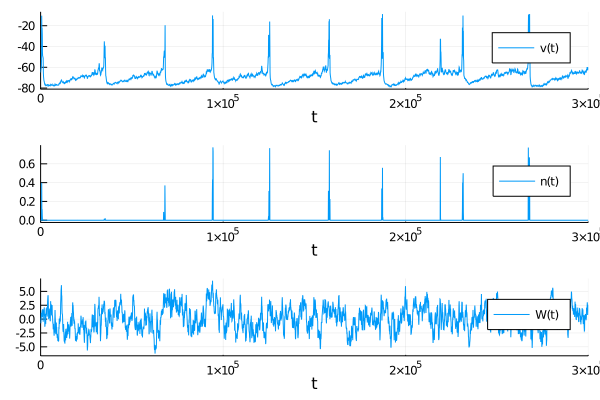

In [10]:
plot(SDEsol, vars = [:v, :n, :W], layout = grid(3, 1))

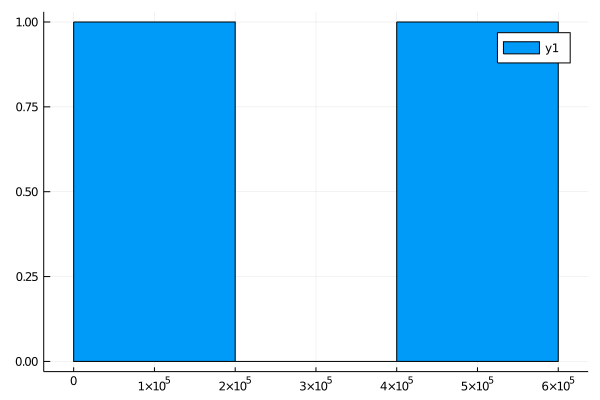

In [54]:
Wt = map(t->SDEsol(t)[7], SDEsol.t);
histogram(Wt)
#plot(p_dict[:σ] .* abs.(Wt))

In [13]:
import RetinalChaos.ensemble_func

In [14]:
n_sims = 50
par = :σ
p_range = LinRange(0.01, 0.5, n_sims)
prob_func(prob, i, repeat) = ensemble_func(prob, i, repeat; pars = [par], par_range = p_range)
ensemble_prob = EnsembleProblem(SDEprob, prob_func = prob_func)
@time sim = solve(ensemble_prob, SOSRI(), abstol = 0.2, reltol = 2e-2, maxiters = 1e7, saveat = 100.0, trajectories = n_sims, EnsembleThreads());

 32.612264 seconds (99.14 M allocations: 1.969 GiB, 1.90% gc time)


In [20]:
vars = [:v :c :a :W]
p = plot(layout = grid(length(vars),1), xlims = (0, 60e3), size = (800, 800))
for (idx, traj) in enumerate(sim)
    val = p_range[idx]
    plot!(p, traj, vars = vars, c = :delta, line_z = val, clim = (p_range[1], p_range[end]), legend = :none)
    #plot(p, )
end
p

In [65]:
p = plot(size = (800, 800))
for (idx, traj) in enumerate(sim)
    val = p_range[idx]
    vt = map(t -> traj(t)[1], sol.t)
    nt = map(t -> traj(t)[2], sol.t)
    z = repeat([val], length(vt))
    plot!(p, z, vt, nt,  line_z = val, clim = (p_range[1], p_range[end]), legend = :none)
    #plot!(p, traj, vars = vars, c = :delta, line_z = val, clim = (p_range[1], p_range[end]), legend = :none)
    #plot(p, )
end
p

UndefVarError: UndefVarError: sol not defined

In [ ]:
p_dict = read_JSON("params.json", is_type = Dict{Symbol, Float64});
u_dict = read_JSON("conds.json", is_type = Dict{Symbol, Float64});
p_dict[:g_ACh] = 5.0 #For now null out Acetylcholine autoreceptors
p_dict[:I_app] = 0.0
p_dict[:σ] = 10.0

In [ ]:
nx = ny = 64
u0_mat = cat(map(x->fill(u_dict[x], (nx, ny)), BurstModel.syms)..., dims = 3);
p0 = map(x -> Float64(p_dict[x]), BurstModel.params);
tspan = (0.0, 400.0)
SDE_mat_prob = SDEProblem(BurstModel_2D, noise_2D, u0_mat, tspan, p0);

In [ ]:
println("Simulating: $(tspan[end])ms:")
@time SDE_mat_sol = solve(SDE_mat_prob, EM(), dt = 0.001,  adaptive = false,);

In [ ]:
SDE_sol_arr = Array(SDE_mat_sol);
SDE_sol_arr |> size